In [ ]:
#logist regression task 

https://archive.ics.uci.edu/ml/datasets/Activity+Recognition+system+based+on+Multisensor+data+fusion+%28AReM%29#
    
Task Logistic Regression
~~~~~~~~~
1. WAP to read folder name and make a label in the csv with folder name
2. Remove unneccesarry info in Automated way
3. No other algorithm must be used other than Logistic Regression
4. Try to utilize multiple solvers and make multiple models
5. Provide the best models
6. EDA and all must be done accordingly
Note: No manual approaches will be appreciated

## Activity Recognition system

In [2]:
#import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import os
from sklearn.metrics import confusion_matrix , accuracy_score , f1_score , recall_score ,roc_curve,auc

C:\Users\Chidu\AppData\Roaming\Python\Python37\site-packages\pandas\compat\_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.9' currently installed).
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifical

In [4]:
activities=['bending1','bending2','cycling','lying','sitting','standing','walking']
features=['avg_rss12', 'var_rss12', 'avg_rss13','var_rss13','avg_rss23','var_rss23']    

In [5]:
for activity in activities:
    list_dataframes=[]
    path=f'C:\\Users\\Chidu\\Downloads\\AReM\\{activity}'
    
    if activity == 'bending1':
        for file in os.listdir(path):
            list_dataframes.append(pd.read_csv(path+'\\'+file,skiprows=4,usecols=range(7)))
        df1=pd.concat(list_dataframes)
        df1['Target']=activity
    elif activity == 'bending2':
        for file in os.listdir(path):
            list_dataframes.append(pd.read_csv(path+'\\'+file,skiprows=4,usecols=range(7)))
        df2=pd.concat(list_dataframes)
        df2['Target']=activity
    elif activity == 'cycling':
        for file in os.listdir(path):
            list_dataframes.append(pd.read_csv(path+'\\'+file,skiprows=4,usecols=range(7)))
        df3=pd.concat(list_dataframes)
        df3['Target']=activity
    elif activity == 'lying':
        for file in os.listdir(path):
            list_dataframes.append(pd.read_csv(path+'\\'+file,skiprows=4,usecols=range(7)))
        df4=pd.concat(list_dataframes)
        df4['Target']=activity
    elif activity == 'sitting':
        for file in os.listdir(path):
            list_dataframes.append(pd.read_csv(path+'\\'+file,skiprows=4,usecols=range(7)))
        df5=pd.concat(list_dataframes)
        df5['Target']=activity
    elif activity == 'standing':
        for file in os.listdir(path):
            list_dataframes.append(pd.read_csv(path+'\\'+file,skiprows=4,usecols=range(7)))
        df6=pd.concat(list_dataframes)
        df6['Target']=activity
    elif activity == 'walking':
        for file in os.listdir(path):
            list_dataframes.append(pd.read_csv(path+'\\'+file,skiprows=4,usecols=range(7)))
        df7=pd.concat(list_dataframes)
        df7['Target']=activity

In [6]:
data=pd.concat([df1,df2,df3,df4,df5,df6,df7])

In [7]:
data.head()

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Target
0,0,39.25,0.43,22.75,0.43,33.75,1.3,bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.0,bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.0,bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.0,bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.0,bending1


In [8]:
data.describe()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
count,41759.000000,41759.000000,41759.000000,41759.000000,41759.000000,41759.000000
mean,39.021121,1.472970,14.348414,1.513248,16.011230,1.631269
std,6.297484,2.055411,5.414506,1.644231,6.768319,1.642659
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35.250000,0.430000,11.500000,0.430000,12.000000,0.470000
50%,40.000000,0.500000,15.000000,0.830000,15.750000,1.000000
75%,44.000000,1.870000,18.000000,2.350000,19.250000,2.360000
max,56.250000,17.240000,35.000000,11.420000,40.330000,13.610000


In [9]:
#Dropping time column
data.drop(columns='# Columns: time',inplace=True)

In [10]:
data.head()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Target
0,39.25,0.43,22.75,0.43,33.75,1.3,bending1
1,39.25,0.43,23.00,0.00,33.00,0.0,bending1
2,39.25,0.43,23.25,0.43,33.00,0.0,bending1
3,39.50,0.50,23.00,0.71,33.00,0.0,bending1
4,39.50,0.50,24.00,0.00,33.00,0.0,bending1


In [11]:
from pandas_profiling import ProfileReport

In [16]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
#Replace nan values with the mean 
data['avg_rss12']=data['avg_rss12'].fillna(data['avg_rss12'].mean())
data['var_rss12']=data['var_rss12'].fillna(data['var_rss12'].mean())
data['avg_rss13']=data['avg_rss13'].fillna(data['avg_rss13'].mean())
data['var_rss13']=data['var_rss13'].fillna(data['var_rss13'].mean())
data['avg_rss23']=data['avg_rss23'].fillna(data['avg_rss23'].mean())
data['var_rss23']=data['var_rss23'].fillna(data['var_rss23'].mean())

In [13]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

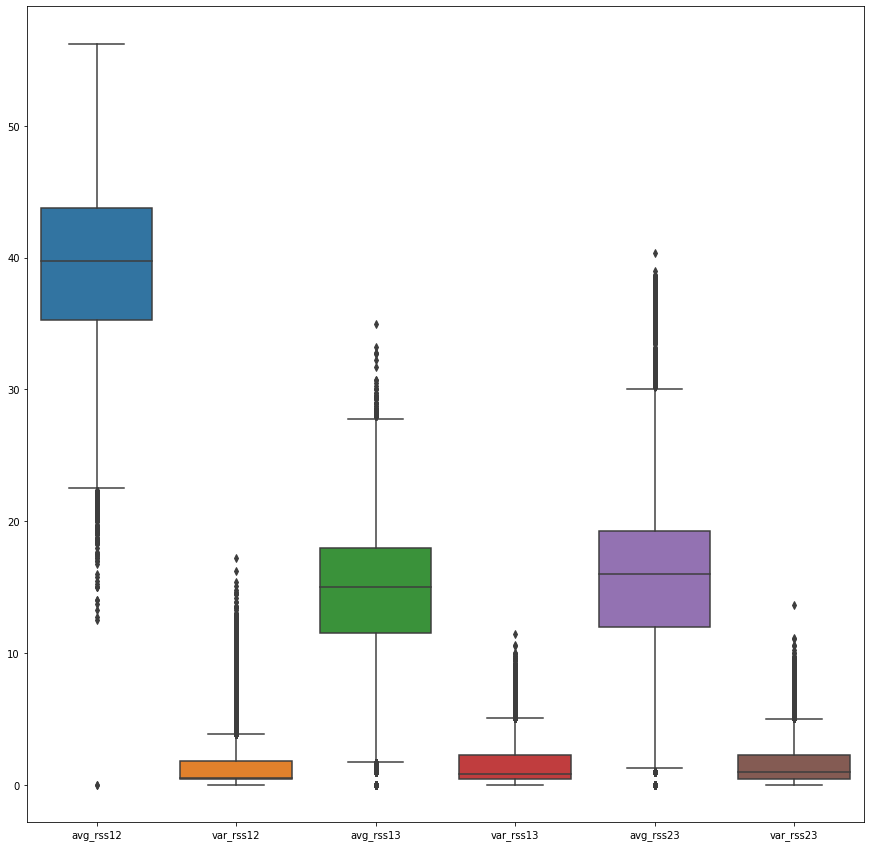

In [14]:
# Printing the boxplot
fig, axs=plt.subplots(figsize=(15,15))
sb.boxplot(data=data[features])

In [47]:
#function to calculate the IQR values

def get_IQRDetails(df,feature):
    q1=df[feature].quantile(0.25)
    q3=df[feature].quantile(0.75)
    IQR=q3-q1
    minimum=q1-1.5*IQR
    maximum=q3+1.5*IQR
    return q1,q3,minimum,maximum

In [64]:
#In avg_rss12 column,the outliers are there below the minimum value, so we will remove the data less than the minimum.
Q1,Q3,Min,Max=get_IQRDetails(data,'avg_rss12')
df_new=data[data['avg_rss12']>Min]

In [65]:
#In var_rss12 column,the outliers are there above the maximum value, so we will remove the data more than the maximum.
Q1,Q3,Min,Max=get_IQRDetails(df_new,'var_rss12')
df_new=df_new[df_new['var_rss12']<Max]

In [66]:
#In avg_rss13 column,the outliers are there above the maximum value, so we will remove the data more than the maximum.
Q1,Q3,Min,Max=get_IQRDetails(df_new,'avg_rss13')
df_new=df_new[df_new['avg_rss13']<Max]

In [67]:
#In var_rss13 column,the outliers are there above the maximum value, so we will remove the data more than the maximum.
Q1,Q3,Min,Max=get_IQRDetails(df_new,'var_rss13')
df_new=df_new[df_new['var_rss13']<Max]

In [68]:
#In avg_rss23 column,the outliers are there above the maximum value, so we will remove the data more than the maximum.
Q1,Q3,Min,Max=get_IQRDetails(df_new,'avg_rss23')
df_new=df_new[df_new['avg_rss23']<Max]

In [77]:
#In var_rss23 column,the outliers are there above the maximum value, so we will remove the data more than the maximum.
Q1,Q3,Min,Max=get_IQRDetails(df_new,'var_rss23')
df_new=df_new[df_new['var_rss23']<Max]

<AxesSubplot:>

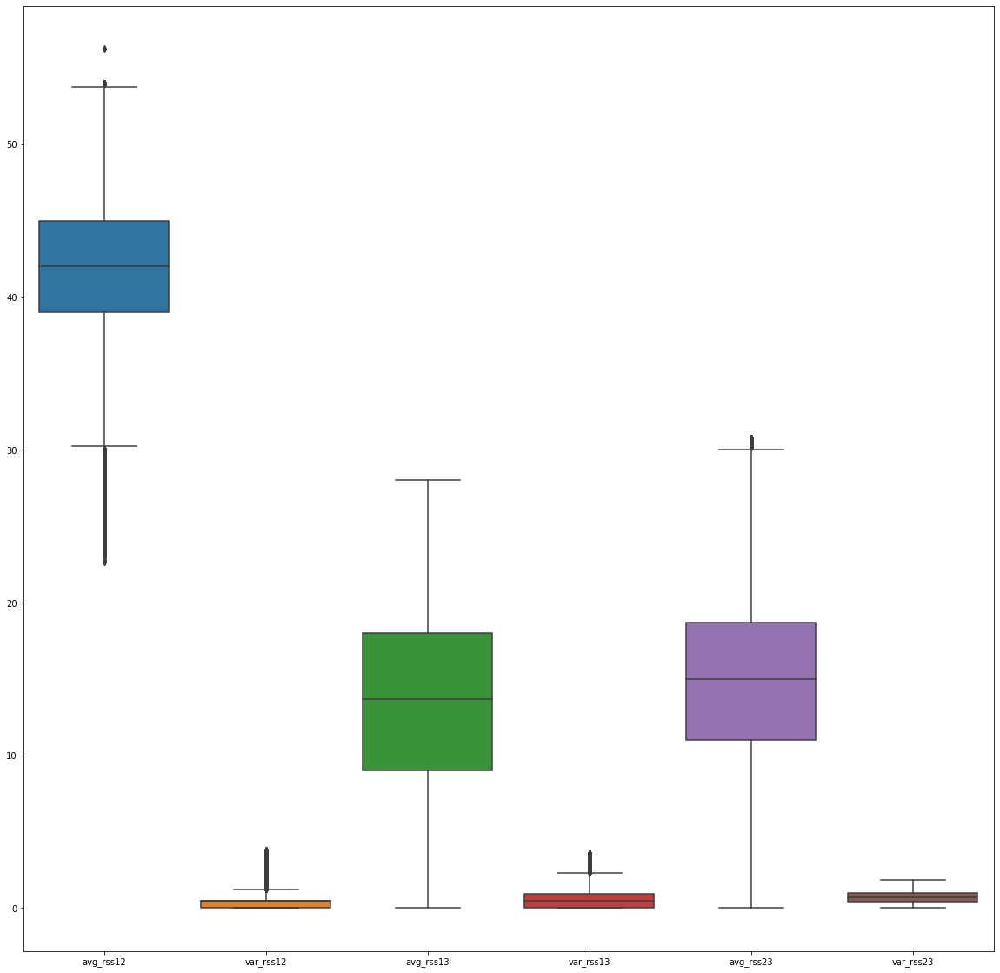

In [78]:
fig,ax=plt.subplots(figsize=(20,20))
sb.boxplot(data=df_new)

In [82]:
df_new[df_new['var_rss23']==0]

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Target
400,41.00,0.71,21.00,0.00,30.0,0.0,bending1
404,45.00,0.00,27.50,0.50,30.0,0.0,bending1
405,44.67,0.47,25.67,0.47,30.0,0.0,bending1
408,42.00,0.00,22.50,0.50,30.0,0.0,bending1
411,42.00,0.00,21.00,0.00,30.0,0.0,bending1
...,...,...,...,...,...,...,...
202,30.00,0.00,13.50,1.50,11.0,0.0,walking
269,38.67,2.49,14.50,2.87,16.0,0.0,walking
373,36.00,2.12,13.00,2.45,12.0,0.0,walking
460,31.67,3.09,21.00,2.12,12.0,0.0,walking


In [76]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [83]:

#Replacing zero values with the mean
df_new['var_rss12']=df_new['var_rss12'].replace(0,df_new['var_rss12'].mean())

In [85]:
df_new['var_rss13']=df_new['var_rss13'].replace(0,df_new['var_rss13'].mean())

In [86]:
df_new['var_rss23']=df_new['var_rss23'].replace(0,df_new['var_rss23'].mean())

In [87]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/21 [00:01<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [94]:
#Selecting the dependent and independent variable
x=df_new.drop(columns='Target')

In [95]:
y=df_new['Target']

In [100]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)

In [101]:
solvers=['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
for solver in solvers:
    l1=LogisticRegression(solver=solver)
    l1.fit(x_train,y_train)
    y_pred=l1.predict(x_test)
    print(f'Accuracy using the solver {solver} is',accuracy_score(y_test,y_pred))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Accuracy using the solver newton-cg is 0.6177979479084451


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


Accuracy using the solver lbfgs is 0.6177979479084451


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Accuracy using the solver liblinear is 0.617008681925809


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\sag.py:334: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


Accuracy using the solver sag is 0.6130623520126283


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\sag.py:334: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


Accuracy using the solver saga is 0.6241120757695343


## From the above result, newton-saga is a better solver and it can be used for predicting the test data